# Lab14: MDP & Q-Learning & SARSA

In this lab, we will introduce the conception of Markov Decision Process(MDP) and two solution algorithms, 
and then we will introduce the Q-Learning and SARSA algorithm, 
finally we will use the Q-learning/SARSA algorithm to train an agent to play "Flappy Bird" game.

In [1]:
from ple.games.flappybird import FlappyBird
from ple import PLE
import matplotlib.pyplot as plt
import os
import numpy as np

%matplotlib inline
os.environ["SDL_VIDEODRIVER"] = "dummy"  # this line disable pop-out window
game = FlappyBird()
env = PLE(game, fps=30, display_screen=False)  # environment interface to game
env.reset_game()

pygame 2.5.2 (SDL 2.28.3, Python 3.9.18)
Hello from the pygame community. https://www.pygame.org/contribute.html
couldn't import doomish
Couldn't import doom


In [2]:
# return a dictionary whose key is action description and value is action index
print(game.actions)
# return a list of action index (include None)
print(env.getActionSet())

{'up': 119}
[119, None]


In [3]:
# a dictionary describe state
'''
    player y position.
    players velocity.
    next pipe distance to player
    next pipe top y position
    next pipe bottom y position
    next next pipe distance to player
    next next pipe top y position
    next next pipe bottom y position
'''
game.getGameState()  

{'player_y': 256,
 'player_vel': 0,
 'next_pipe_dist_to_player': 309.0,
 'next_pipe_top_y': 144,
 'next_pipe_bottom_y': 244,
 'next_next_pipe_dist_to_player': 453.0,
 'next_next_pipe_top_y': 160,
 'next_next_pipe_bottom_y': 260}

## Q-learning

In [4]:
import math
import copy
from collections import defaultdict
MIN_EXPLORING_RATE = 0.01
MIN_LEARNING_RATE = 0.5


class QlearningAgent:

    def __init__(self,
                 bucket_range_per_feature,
                 num_action,
                 t=0,
                 discount_factor=0.99):
        self.update_parameters(t)  # init explore rate and learning rate
        self.q_table = defaultdict(lambda: np.zeros(num_action))
        self.discount_factor = discount_factor
        self.num_action = num_action

        # how to discretize each feature in a state
        # the higher each value, less time to train but with worser performance
        # e.g. if range = 2, feature with value 1 is equal to feature with value 0 bacause int(1/2) = int(0/2)
        self.bucket_range_per_feature = bucket_range_per_feature

    def select_action(self, state):
        # epsilon-greedy
        state_idx = self.get_state_idx(state)
        if np.random.rand() < self.exploring_rate:
            action = np.random.choice(num_action)  # Select a random action
        else:
            action = np.argmax(
                self.q_table[state_idx])  # Select the action with the highest q
        return action

    def update_policy(self, state, action, reward, state_prime):
        state_idx = self.get_state_idx(state)
        state_prime_idx = self.get_state_idx(state_prime)
        # Update Q_value using Q-learning update rule
        best_q = np.max(self.q_table[state_prime_idx])
        self.q_table[state_idx][action] += self.learning_rate * (
            reward + self.discount_factor * best_q - self.q_table[state_idx][action])

    def get_state_idx(self, state):
        # instead of using absolute position of pipe, use relative position
        state = copy.deepcopy(state)
        state['next_next_pipe_bottom_y'] -= state['player_y']
        state['next_next_pipe_top_y'] -= state['player_y']
        state['next_pipe_bottom_y'] -= state['player_y']
        state['next_pipe_top_y'] -= state['player_y']

        # sort to make list converted from dict ordered in alphabet order
        state_key = [k for k, v in sorted(state.items())]

        # do bucketing to decrease state space to speed up training
        state_idx = []
        for key in state_key:
            state_idx.append(
                int(state[key] / self.bucket_range_per_feature[key]))
        return tuple(state_idx)

    def update_parameters(self, episode):
        self.exploring_rate = max(MIN_EXPLORING_RATE,
                                  min(0.5, 0.99**((episode) / 30)))
        self.learning_rate = max(MIN_LEARNING_RATE, min(0.5, 0.99
                                                        ** ((episode) / 30)))

    def shutdown_explore(self):
        # make action selection greedy
        self.exploring_rate = 0

In [5]:
num_action = len(env.getActionSet())
bucket_range_per_feature = {
  'next_next_pipe_bottom_y': 40,
  'next_next_pipe_dist_to_player': 512,
  'next_next_pipe_top_y': 40,
  'next_pipe_bottom_y': 20,
  'next_pipe_dist_to_player': 20,
  'next_pipe_top_y': 20,
  'player_vel': 4,
  'player_y': 16
}
# init agent
Qagent = QlearningAgent(bucket_range_per_feature, num_action)

In [6]:
import moviepy.editor as mpy


def make_anim(images, fps=60, true_image=False):
    duration = len(images) / fps

    def make_frame(t):
        try:
            x = images[int(len(images) / duration * t)]
        except:
            x = images[-1]

        if true_image:
            return x.astype(np.uint8)
        else:
            return ((x + 1) / 2 * 255).astype(np.uint8)

    clip = mpy.VideoClip(make_frame, duration=duration)
    clip.fps = fps
    return clip

In [7]:
from IPython.display import Image, display
from tqdm import trange

reward_per_epoch_Q = []
lifetime_per_epoch_Q = []
exploring_rates = []
learning_rates = []
print_every_episode = 500
show_gif_every_episode = 5000
NUM_EPISODE = 40000

pbar = trange(NUM_EPISODE, desc="Training Episodes", unit="episode")

for episode in pbar:

    # Reset the environment
    env.reset_game()

    # record frame
    frames = [env.getScreenRGB()]

    # for every 500 episodes, shutdown exploration to see performance of greedy action
    if episode % print_every_episode == 0:
        Qagent.shutdown_explore()

    # the initial state
    state = game.getGameState()
    # cumulate reward for this episode
    cum_reward = 0  
    t = 0

    while not env.game_over():

        # select an action
        action = Qagent.select_action(state)

        # execute the action and get reward
        # reward = +1 when pass a pipe, -5 when die
        reward = env.act(env.getActionSet()[action])  

        frames.append(env.getScreenRGB())

        # cumulate reward
        cum_reward += reward

        # observe the result
        state_prime = game.getGameState()  # get next state

        # update agent
        Qagent.update_policy(state, action, reward, state_prime)

        # Setting up for the next iteration
        state = state_prime
        t += 1

    # update exploring_rate and learning_rate
    Qagent.update_parameters(episode)

    if episode % print_every_episode == 0:
        print("Episode {} finished after {} time steps, cumulated reward: {}, exploring rate: {}, learning rate: {}".format(
            episode,
            t,
            cum_reward,
            Qagent.exploring_rate,
            Qagent.learning_rate
        ))
        reward_per_epoch_Q.append(cum_reward)
        exploring_rates.append(Qagent.exploring_rate)
        learning_rates.append(Qagent.learning_rate)
        lifetime_per_epoch_Q.append(t)

    # for every 5000 episode, record an animation
    if episode % show_gif_every_episode == 0:
        print("len frames:", len(frames))
        clip = make_anim(frames, fps=60, true_image=True).rotate(-90)
        display(clip.ipython_display(fps=60, autoplay=1, loop=1))

Training Episodes:   0%|          | 0/40000 [00:00<?, ?episode/s]

Episode 0 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5
len frames: 63
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:   0%|          | 0/40000 [00:00<?, ?episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:   1%|▏         | 504/40000 [00:24<35:47, 18.39episode/s]

Episode 500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5


Training Episodes:   3%|▎         | 1004/40000 [00:48<29:47, 21.82episode/s]

Episode 1000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5


Training Episodes:   4%|▍         | 1505/40000 [01:12<30:22, 21.12episode/s]

Episode 1500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5


Training Episodes:   5%|▌         | 2003/40000 [01:36<29:01, 21.82episode/s]

Episode 2000 finished after 61 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5


Training Episodes:   6%|▋         | 2504/40000 [01:59<29:49, 20.95episode/s]

Episode 2500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.43277903725889943, learning rate: 0.5


Training Episodes:   8%|▊         | 3004/40000 [02:24<30:57, 19.91episode/s]

Episode 3000 finished after 63 time steps, cumulated reward: -5.0, exploring rate: 0.3660323412732292, learning rate: 0.5


Training Episodes:   9%|▉         | 3503/40000 [02:48<29:01, 20.95episode/s]

Episode 3500 finished after 61 time steps, cumulated reward: -5.0, exploring rate: 0.30957986252419073, learning rate: 0.5


Training Episodes:  10%|█         | 4004/40000 [03:13<29:03, 20.64episode/s]

Episode 4000 finished after 65 time steps, cumulated reward: -5.0, exploring rate: 0.26183394327157605, learning rate: 0.5


Training Episodes:  11%|█▏        | 4505/40000 [03:38<29:34, 20.01episode/s]

Episode 4500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.22145178723886091, learning rate: 0.5


Training Episodes:  12%|█▏        | 4998/40000 [04:03<28:26, 20.51episode/s]

Episode 5000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.18729769509073985, learning rate: 0.5
len frames: 63
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:  12%|█▏        | 4998/40000 [04:03<28:26, 20.51episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:  14%|█▍        | 5505/40000 [04:30<29:35, 19.42episode/s]

Episode 5500 finished after 71 time steps, cumulated reward: -4.0, exploring rate: 0.15841112426184903, learning rate: 0.5


Training Episodes:  15%|█▌        | 6003/40000 [04:56<33:47, 16.77episode/s]

Episode 6000 finished after 73 time steps, cumulated reward: -4.0, exploring rate: 0.13397967485796172, learning rate: 0.5


Training Episodes:  16%|█▋        | 6504/40000 [05:24<28:47, 19.39episode/s]

Episode 6500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.11331624189077398, learning rate: 0.5


Training Episodes:  18%|█▊        | 7003/40000 [05:51<29:46, 18.47episode/s]

Episode 7000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.09583969128049684, learning rate: 0.5


Training Episodes:  19%|█▉        | 7503/40000 [06:19<32:01, 16.91episode/s]

Episode 7500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.08105851616218128, learning rate: 0.5


Training Episodes:  20%|██        | 8003/40000 [06:47<32:14, 16.54episode/s]

Episode 8000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.0685570138491429, learning rate: 0.5


Training Episodes:  21%|██▏       | 8501/40000 [07:15<31:28, 16.68episode/s]

Episode 8500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.05798359469728905, learning rate: 0.5


Training Episodes:  23%|██▎       | 9004/40000 [07:45<28:49, 17.92episode/s]

Episode 9000 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.04904089407128572, learning rate: 0.5


Training Episodes:  24%|██▍       | 9504/40000 [08:14<30:44, 16.53episode/s]

Episode 9500 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.04147740932356356, learning rate: 0.5


Training Episodes:  25%|██▍       | 9999/40000 [08:47<33:10, 15.07episode/s]

Episode 10000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.03508042658630376, learning rate: 0.5
len frames: 63
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:  25%|██▍       | 9999/40000 [08:47<33:10, 15.07episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:  26%|██▋       | 10504/40000 [09:19<29:19, 16.77episode/s]

Episode 10500 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.029670038450977102, learning rate: 0.5


Training Episodes:  28%|██▊       | 11001/40000 [09:52<32:28, 14.88episode/s]

Episode 11000 finished after 77 time steps, cumulated reward: -4.0, exploring rate: 0.02509408428990297, learning rate: 0.5


Training Episodes:  29%|██▉       | 11503/40000 [10:25<29:41, 16.00episode/s]

Episode 11500 finished after 75 time steps, cumulated reward: -4.0, exploring rate: 0.021223870922486707, learning rate: 0.5


Training Episodes:  30%|███       | 12004/40000 [11:00<27:01, 17.26episode/s]

Episode 12000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.017950553275045137, learning rate: 0.5


Training Episodes:  31%|███▏      | 12503/40000 [11:36<33:30, 13.68episode/s]

Episode 12500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.015182073244652034, learning rate: 0.5


Training Episodes:  33%|███▎      | 13004/40000 [12:16<34:24, 13.07episode/s]  

Episode 13000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.012840570676248398, learning rate: 0.5


Training Episodes:  34%|███▍      | 13502/40000 [12:57<32:35, 13.55episode/s]

Episode 13500 finished after 188 time steps, cumulated reward: -1.0, exploring rate: 0.010860193639877882, learning rate: 0.5


Training Episodes:  35%|███▌      | 14002/40000 [13:41<29:39, 14.61episode/s]  

Episode 14000 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  36%|███▋      | 14503/40000 [14:29<29:10, 14.56episode/s]  

Episode 14500 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  38%|███▊      | 15000/40000 [15:19<34:13, 12.18episode/s]  

Episode 15000 finished after 61 time steps, cumulated reward: -5.0, exploring rate: 0.01, learning rate: 0.5
len frames: 62
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:  38%|███▊      | 15000/40000 [15:19<34:13, 12.18episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:  39%|███▉      | 15500/40000 [16:13<35:39, 11.45episode/s]  

Episode 15500 finished after 175 time steps, cumulated reward: -2.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  40%|████      | 16002/40000 [17:17<56:19,  7.10episode/s]  

Episode 16000 finished after 134 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  41%|████▏     | 16503/40000 [18:28<44:32,  8.79episode/s]  

Episode 16500 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  43%|████▎     | 17002/40000 [19:40<1:38:51,  3.88episode/s]

Episode 17000 finished after 55 time steps, cumulated reward: -5.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  44%|████▍     | 17503/40000 [20:50<56:08,  6.68episode/s]  

Episode 17500 finished after 134 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  45%|████▌     | 18003/40000 [21:58<38:04,  9.63episode/s]  

Episode 18000 finished after 175 time steps, cumulated reward: -2.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  46%|████▋     | 18502/40000 [23:09<45:18,  7.91episode/s]  

Episode 18500 finished after 134 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  48%|████▊     | 19003/40000 [24:25<37:33,  9.32episode/s]  

Episode 19000 finished after 288 time steps, cumulated reward: 1.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  49%|████▉     | 19501/40000 [25:40<52:30,  6.51episode/s]  

Episode 19500 finished after 91 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  50%|█████     | 20000/40000 [27:01<27:49, 11.98episode/s]  

Episode 20000 finished after 550 time steps, cumulated reward: 8.0, exploring rate: 0.01, learning rate: 0.5
len frames: 551
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:  50%|█████     | 20000/40000 [27:01<27:49, 11.98episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:  51%|█████▏    | 20500/40000 [28:27<1:03:56,  5.08episode/s]

Episode 20500 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  53%|█████▎    | 21002/40000 [29:54<1:39:30,  3.18episode/s]

Episode 21000 finished after 1208 time steps, cumulated reward: 26.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  54%|█████▍    | 21502/40000 [31:43<1:13:34,  4.19episode/s]

Episode 21500 finished after 360 time steps, cumulated reward: 3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  55%|█████▌    | 22002/40000 [33:38<1:00:55,  4.92episode/s]

Episode 22000 finished after 449 time steps, cumulated reward: 6.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  56%|█████▋    | 22503/40000 [35:26<41:23,  7.04episode/s]  

Episode 22500 finished after 184 time steps, cumulated reward: -1.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  58%|█████▊    | 23002/40000 [37:23<43:01,  6.58episode/s]  

Episode 23000 finished after 86 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  59%|█████▉    | 23503/40000 [39:07<49:09,  5.59episode/s]  

Episode 23500 finished after 514 time steps, cumulated reward: 7.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  60%|██████    | 24000/40000 [41:03<1:27:01,  3.06episode/s]

Episode 24000 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  61%|██████▏   | 24503/40000 [43:10<30:41,  8.42episode/s]  

Episode 24500 finished after 134 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  62%|██████▎   | 25000/40000 [45:22<2:46:23,  1.50episode/s]

Episode 25000 finished after 374 time steps, cumulated reward: 4.0, exploring rate: 0.01, learning rate: 0.5
len frames: 375
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:  62%|██████▎   | 25000/40000 [45:23<2:46:23,  1.50episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:  64%|██████▍   | 25501/40000 [48:05<1:04:27,  3.75episode/s]

Episode 25500 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  65%|██████▌   | 26002/40000 [50:56<1:04:20,  3.63episode/s]

Episode 26000 finished after 586 time steps, cumulated reward: 9.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  66%|██████▋   | 26502/40000 [53:38<55:10,  4.08episode/s]  

Episode 26500 finished after 134 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  68%|██████▊   | 27001/40000 [57:14<2:12:33,  1.63episode/s]

Episode 27000 finished after 2089 time steps, cumulated reward: 49.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  69%|██████▉   | 27502/40000 [1:00:37<53:52,  3.87episode/s]  

Episode 27500 finished after 210 time steps, cumulated reward: -1.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  70%|███████   | 28002/40000 [1:04:22<1:05:56,  3.03episode/s]

Episode 28000 finished after 107 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  71%|███████▏  | 28501/40000 [1:07:47<1:28:40,  2.16episode/s]

Episode 28500 finished after 1002 time steps, cumulated reward: 20.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  73%|███████▎  | 29001/40000 [1:11:11<1:02:42,  2.92episode/s]

Episode 29000 finished after 473 time steps, cumulated reward: 6.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  74%|███████▍  | 29501/40000 [1:14:43<1:27:19,  2.00episode/s]

Episode 29500 finished after 812 time steps, cumulated reward: 15.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  75%|███████▌  | 30000/40000 [1:18:17<59:24,  2.81episode/s]  

Episode 30000 finished after 1093 time steps, cumulated reward: 23.0, exploring rate: 0.01, learning rate: 0.5
len frames: 1094
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:  75%|███████▌  | 30000/40000 [1:18:18<59:24,  2.81episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:  76%|███████▋  | 30501/40000 [1:22:51<2:22:27,  1.11episode/s]

Episode 30500 finished after 1567 time steps, cumulated reward: 35.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  78%|███████▊  | 31001/40000 [1:27:49<1:19:44,  1.88episode/s]

Episode 31000 finished after 143 time steps, cumulated reward: -2.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  79%|███████▉  | 31501/40000 [1:32:31<48:29,  2.92episode/s]  

Episode 31500 finished after 627 time steps, cumulated reward: 10.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  80%|████████  | 32001/40000 [1:38:05<58:02,  2.30episode/s]  

Episode 32000 finished after 360 time steps, cumulated reward: 3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  81%|████████▏ | 32501/40000 [1:44:36<1:44:01,  1.20episode/s]

Episode 32500 finished after 1151 time steps, cumulated reward: 24.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  82%|████████▎ | 33000/40000 [1:50:50<1:38:56,  1.18episode/s]

Episode 33000 finished after 77 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  84%|████████▍ | 33501/40000 [1:57:04<2:18:31,  1.28s/episode]

Episode 33500 finished after 2578 time steps, cumulated reward: 62.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  85%|████████▌ | 34001/40000 [2:04:17<1:00:31,  1.65episode/s]

Episode 34000 finished after 566 time steps, cumulated reward: 9.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  86%|████████▋ | 34502/40000 [2:16:08<1:57:15,  1.28s/episode]

Episode 34500 finished after 2254 time steps, cumulated reward: 54.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  88%|████████▊ | 35000/40000 [2:28:31<42:54,  1.94episode/s]  

Episode 35000 finished after 3072 time steps, cumulated reward: 75.0, exploring rate: 0.01, learning rate: 0.5
len frames: 3073
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:  88%|████████▊ | 35000/40000 [2:28:35<42:54,  1.94episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:  89%|████████▉ | 35501/40000 [2:40:07<2:35:31,  2.07s/episode]

Episode 35500 finished after 4166 time steps, cumulated reward: 104.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  90%|█████████ | 36001/40000 [2:50:49<2:49:36,  2.54s/episode]

Episode 36000 finished after 1192 time steps, cumulated reward: 25.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  91%|█████████▏| 36501/40000 [3:02:15<1:01:49,  1.06s/episode]

Episode 36500 finished after 247 time steps, cumulated reward: 0.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  93%|█████████▎| 37001/40000 [3:13:46<53:29,  1.07s/episode]  

Episode 37000 finished after 1307 time steps, cumulated reward: 28.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  94%|█████████▍| 37502/40000 [3:26:16<42:18,  1.02s/episode]  

Episode 37500 finished after 2846 time steps, cumulated reward: 69.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  95%|█████████▌| 38002/40000 [3:38:48<20:44,  1.61episode/s]  

Episode 38000 finished after 46 time steps, cumulated reward: -5.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  96%|█████████▋| 38501/40000 [3:55:05<47:15,  1.89s/episode]  

Episode 38500 finished after 1921 time steps, cumulated reward: 45.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  98%|█████████▊| 39001/40000 [4:07:08<08:30,  1.96episode/s]  

Episode 39000 finished after 360 time steps, cumulated reward: 3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  99%|█████████▉| 39501/40000 [4:17:27<04:54,  1.69episode/s]

Episode 39500 finished after 627 time steps, cumulated reward: 10.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes: 100%|██████████| 40000/40000 [4:24:32<00:00,  2.52episode/s]


In [8]:
def Qdemo(filename):
    # Reset the environment
    env.reset_game()

    # record frame
    frames = [env.getScreenRGB()]

    # shutdown exploration to see performance of greedy action
    Qagent.shutdown_explore()

    # the initial state
    state = game.getGameState()

    while not env.game_over():
        # select an action
        action = Qagent.select_action(state)

        # execute the action and get reward
        reward = env.act(env.getActionSet()[action])

        frames.append(env.getScreenRGB())

        # observe the result
        state_prime = game.getGameState()  # get next state

        # Setting up for the next iteration
        state = state_prime

    clip = make_anim(frames, fps=60, true_image=True).rotate(-90)
    display(clip.ipython_display(fps=60, autoplay=1, loop=1))
    clip.write_videofile(filename)

Qdemo('./Q-learning_clip.mp4')

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Moviepy - Building video ./Q-learning_clip.mp4.
Moviepy - Writing video ./Q-learning_clip.mp4



Moviepy - Done !
Moviepy - video ready ./Q-learning_clip.mp4


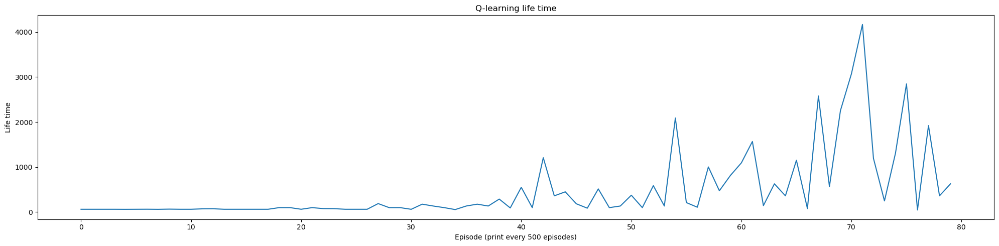

In [9]:
# plot life time against training episodes
fig, ax1 = plt.subplots(figsize=(20, 5))

plt.xlabel(f'Episode (print every {print_every_episode} episodes)')
plt.ylabel('Life time')
plt.title('Q-learning life time')
plt.plot(range(len(lifetime_per_epoch_Q)), lifetime_per_epoch_Q)

fig.tight_layout()
plt.show()

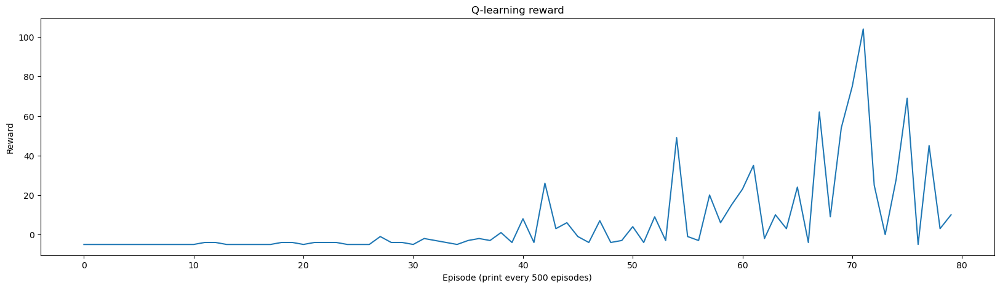

In [10]:
# plot reward against training episodes
fig, ax1 = plt.subplots(figsize=(20, 5))

plt.xlabel(f'Episode (print every {print_every_episode} episodes)')
plt.ylabel('Reward')
plt.title('Q-learning reward')
plt.plot(range(len(reward_per_epoch_Q)), reward_per_epoch_Q)

plt.show()

## SARSA

In [11]:
import math
import copy
from collections import defaultdict
MIN_EXPLORING_RATE = 0.01
MIN_LEARNING_RATE = 0.5


class SARSAagent:

    def __init__(self,
                 bucket_range_per_feature,
                 num_action,
                 t=0,
                 discount_factor=0.99):
        self.update_parameters(t)  # init explore rate and learning rate
        self.q_table = defaultdict(lambda: np.zeros(num_action))
        self.discount_factor = discount_factor
        self.num_action = num_action

        # how to discretize each feature in a state
        # the higher each value, less time to train but with worser performance
        # e.g. if range = 2, feature with value 1 is equal to feature with value 0 bacause int(1/2) = int(0/2)
        self.bucket_range_per_feature = bucket_range_per_feature

    def select_action(self, state):
        # epsilon-greedy
        state_idx = self.get_state_idx(state)
        if np.random.rand() < self.exploring_rate:
            action = np.random.choice(num_action)  # Select a random action
        else:
            action = np.argmax(
                self.q_table[state_idx])  # Select the action with the highest q
        return action

    def update_policy(self, state, action, reward, state_prime, next_action):
        state_idx = self.get_state_idx(state)
        state_prime_idx = self.get_state_idx(state_prime)
        # Update Q_value using SARSA update rule
        sarsa_q = self.q_table[state_prime_idx][next_action] # Q(s',a')
        self.q_table[state_idx][action] += self.learning_rate * (
            reward + self.discount_factor * sarsa_q - self.q_table[state_idx][action])

    def get_state_idx(self, state):
        # instead of using absolute position of pipe, use relative position
        state = copy.deepcopy(state)
        state['next_next_pipe_bottom_y'] -= state['player_y']
        state['next_next_pipe_top_y'] -= state['player_y']
        state['next_pipe_bottom_y'] -= state['player_y']
        state['next_pipe_top_y'] -= state['player_y']

        # sort to make list converted from dict ordered in alphabet order
        state_key = [k for k, v in sorted(state.items())]

        # do bucketing to decrease state space to speed up training
        state_idx = []
        for key in state_key:
            state_idx.append(
                int(state[key] / self.bucket_range_per_feature[key]))
        return tuple(state_idx)

    def update_parameters(self, episode):
        self.exploring_rate = max(MIN_EXPLORING_RATE,
                                  min(0.5, 0.99**((episode) / 30)))
        self.learning_rate = max(MIN_LEARNING_RATE, min(0.5, 0.99
                                                        ** ((episode) / 30)))

    def shutdown_explore(self):
        # make action selection greedy
        self.exploring_rate = 0

In [12]:
num_action = len(env.getActionSet())
bucket_range_per_feature = {
  'next_next_pipe_bottom_y': 40,
  'next_next_pipe_dist_to_player': 512,
  'next_next_pipe_top_y': 40,
  'next_pipe_bottom_y': 20,
  'next_pipe_dist_to_player': 20,
  'next_pipe_top_y': 20,
  'player_vel': 4,
  'player_y': 16
}
# init agent
Sagent = SARSAagent(bucket_range_per_feature, num_action)

In [13]:
from IPython.display import Image, display
from tqdm import trange

reward_per_epoch_S = []
lifetime_per_epoch_S = []
exploring_rates = []
learning_rates = []
print_every_episode = 500
show_gif_every_episode = 5000
NUM_EPISODE = 40000

pbar = trange(NUM_EPISODE, desc="Training Episodes", unit="episode")

for episode in pbar:

    # Reset the environment
    env.reset_game()

    # record frame
    frames = [env.getScreenRGB()]

    # for every 500 episodes, shutdown exploration to see performance of greedy action
    if episode % print_every_episode == 0:
        Sagent.shutdown_explore()

    # the initial state
    state = game.getGameState()
    # cumulate reward for this episode
    cum_reward = 0  
    t = 0
    
    # select first action
    action = Sagent.select_action(state)

    while not env.game_over():
        # execute the action and get reward
        # reward = +1 when pass a pipe, -5 when die
        reward = env.act(env.getActionSet()[action])  

        frames.append(env.getScreenRGB())

        # cumulate reward
        cum_reward += reward

        # observe the result
        state_prime = game.getGameState()  # get next state
        next_action = Sagent.select_action(state_prime)  # get next action

        # update agent
        Sagent.update_policy(state, action, reward, state_prime, next_action)

        # Setting up for the next iteration
        state = state_prime
        action = next_action
        t += 1

    # update exploring_rate and learning_rate
    Sagent.update_parameters(episode)

    if episode % print_every_episode == 0:
        print("Episode {} finished after {} time steps, cumulated reward: {}, exploring rate: {}, learning rate: {}".format(
            episode,
            t,
            cum_reward,
            Sagent.exploring_rate,
            Sagent.learning_rate
        ))
        reward_per_epoch_S.append(cum_reward)
        exploring_rates.append(Sagent.exploring_rate)
        learning_rates.append(Sagent.learning_rate)
        lifetime_per_epoch_S.append(t)

    # for every 5000 episode, record an animation
    if episode % show_gif_every_episode == 0:
        print("len frames:", len(frames))
        clip = make_anim(frames, fps=60, true_image=True).rotate(-90)
        display(clip.ipython_display(fps=60, autoplay=1, loop=1))

Training Episodes:   0%|          | 0/40000 [00:00<?, ?episode/s]

Episode 0 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5
len frames: 63


Training Episodes:   0%|          | 0/40000 [00:00<?, ?episode/s]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:   0%|          | 0/40000 [00:00<?, ?episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:   1%|▏         | 503/40000 [00:23<29:30, 22.31episode/s]

Episode 500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5


Training Episodes:   3%|▎         | 1004/40000 [00:46<29:51, 21.77episode/s]

Episode 1000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5


Training Episodes:   4%|▍         | 1505/40000 [01:09<29:56, 21.43episode/s]

Episode 1500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5


Training Episodes:   5%|▌         | 2003/40000 [01:33<29:27, 21.49episode/s]

Episode 2000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5


Training Episodes:   6%|▋         | 2504/40000 [01:56<30:05, 20.77episode/s]

Episode 2500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.43277903725889943, learning rate: 0.5


Training Episodes:   8%|▊         | 3005/40000 [02:20<28:19, 21.77episode/s]

Episode 3000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.3660323412732292, learning rate: 0.5


Training Episodes:   9%|▉         | 3503/40000 [02:44<29:27, 20.65episode/s]

Episode 3500 finished after 66 time steps, cumulated reward: -4.0, exploring rate: 0.30957986252419073, learning rate: 0.5


Training Episodes:  10%|█         | 4004/40000 [03:08<28:16, 21.22episode/s]

Episode 4000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.26183394327157605, learning rate: 0.5


Training Episodes:  11%|█▏        | 4505/40000 [03:33<29:12, 20.25episode/s]

Episode 4500 finished after 61 time steps, cumulated reward: -5.0, exploring rate: 0.22145178723886091, learning rate: 0.5


Training Episodes:  12%|█▏        | 4999/40000 [03:57<28:34, 20.41episode/s]

Episode 5000 finished after 72 time steps, cumulated reward: -4.0, exploring rate: 0.18729769509073985, learning rate: 0.5
len frames: 73
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:  12%|█▏        | 4999/40000 [03:58<28:34, 20.41episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:  14%|█▍        | 5503/40000 [04:23<28:30, 20.16episode/s]

Episode 5500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.15841112426184903, learning rate: 0.5


Training Episodes:  15%|█▌        | 6003/40000 [04:49<31:40, 17.89episode/s]

Episode 6000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.13397967485796172, learning rate: 0.5


Training Episodes:  16%|█▋        | 6504/40000 [05:15<29:47, 18.73episode/s]

Episode 6500 finished after 67 time steps, cumulated reward: -4.0, exploring rate: 0.11331624189077398, learning rate: 0.5


Training Episodes:  18%|█▊        | 7003/40000 [05:42<29:41, 18.52episode/s]

Episode 7000 finished after 71 time steps, cumulated reward: -4.0, exploring rate: 0.09583969128049684, learning rate: 0.5


Training Episodes:  19%|█▉        | 7504/40000 [06:10<30:19, 17.86episode/s]

Episode 7500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.08105851616218128, learning rate: 0.5


Training Episodes:  20%|██        | 8003/40000 [06:39<31:36, 16.87episode/s]

Episode 8000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.0685570138491429, learning rate: 0.5


Training Episodes:  21%|██▏       | 8503/40000 [07:09<34:06, 15.39episode/s]

Episode 8500 finished after 47 time steps, cumulated reward: -5.0, exploring rate: 0.05798359469728905, learning rate: 0.5


Training Episodes:  23%|██▎       | 9002/40000 [07:39<32:16, 16.01episode/s]

Episode 9000 finished after 96 time steps, cumulated reward: -4.0, exploring rate: 0.04904089407128572, learning rate: 0.5


Training Episodes:  24%|██▍       | 9502/40000 [08:09<32:24, 15.68episode/s]

Episode 9500 finished after 75 time steps, cumulated reward: -4.0, exploring rate: 0.04147740932356356, learning rate: 0.5


Training Episodes:  25%|██▌       | 10000/40000 [08:40<32:32, 15.37episode/s]

Episode 10000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.03508042658630376, learning rate: 0.5
len frames: 63
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:  25%|██▌       | 10000/40000 [08:40<32:32, 15.37episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:  26%|██▋       | 10503/40000 [09:14<32:43, 15.03episode/s]  

Episode 10500 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.029670038450977102, learning rate: 0.5


Training Episodes:  28%|██▊       | 11003/40000 [09:52<35:01, 13.80episode/s]

Episode 11000 finished after 60 time steps, cumulated reward: -5.0, exploring rate: 0.02509408428990297, learning rate: 0.5


Training Episodes:  29%|██▉       | 11502/40000 [10:30<33:06, 14.35episode/s]

Episode 11500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.021223870922486707, learning rate: 0.5


Training Episodes:  30%|███       | 12002/40000 [11:11<33:53, 13.77episode/s]  

Episode 12000 finished after 54 time steps, cumulated reward: -5.0, exploring rate: 0.017950553275045137, learning rate: 0.5


Training Episodes:  31%|███▏      | 12503/40000 [11:57<40:32, 11.30episode/s]  

Episode 12500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.015182073244652034, learning rate: 0.5


Training Episodes:  33%|███▎      | 13002/40000 [12:45<41:54, 10.74episode/s]  

Episode 13000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.012840570676248398, learning rate: 0.5


Training Episodes:  34%|███▍      | 13503/40000 [13:38<38:44, 11.40episode/s]  

Episode 13500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.010860193639877882, learning rate: 0.5


Training Episodes:  35%|███▌      | 14004/40000 [14:36<35:27, 12.22episode/s]  

Episode 14000 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  36%|███▋      | 14503/40000 [15:36<46:28,  9.14episode/s]  

Episode 14500 finished after 324 time steps, cumulated reward: 2.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  37%|███▋      | 14999/40000 [16:37<40:46, 10.22episode/s]  

Episode 15000 finished after 134 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5
len frames: 135
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:  37%|███▋      | 14999/40000 [16:37<40:46, 10.22episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:  39%|███▉      | 15502/40000 [17:35<35:09, 11.62episode/s]  

Episode 15500 finished after 107 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  40%|████      | 16002/40000 [18:32<54:06,  7.39episode/s]  

Episode 16000 finished after 134 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  41%|████▏     | 16504/40000 [19:35<30:38, 12.78episode/s]  

Episode 16500 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  43%|████▎     | 17002/40000 [20:43<51:31,  7.44episode/s]  

Episode 17000 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  44%|████▍     | 17503/40000 [21:53<37:30, 10.00episode/s]  

Episode 17500 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  45%|████▌     | 18001/40000 [23:08<1:00:16,  6.08episode/s]

Episode 18000 finished after 225 time steps, cumulated reward: 0.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  46%|████▋     | 18502/40000 [24:24<57:38,  6.22episode/s]  

Episode 18500 finished after 72 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  48%|████▊     | 19002/40000 [25:41<51:01,  6.86episode/s]  

Episode 19000 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  49%|████▉     | 19503/40000 [27:02<36:43,  9.30episode/s]  

Episode 19500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  50%|████▉     | 19999/40000 [28:15<53:44,  6.20episode/s]  

Episode 20000 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5
len frames: 99
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:  50%|████▉     | 19999/40000 [28:15<53:44,  6.20episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:  51%|█████▏    | 20500/40000 [29:36<47:19,  6.87episode/s]  

Episode 20500 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  53%|█████▎    | 21002/40000 [31:12<1:08:38,  4.61episode/s]

Episode 21000 finished after 324 time steps, cumulated reward: 2.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  54%|█████▍    | 21504/40000 [32:45<33:47,  9.12episode/s]  

Episode 21500 finished after 350 time steps, cumulated reward: 3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  55%|█████▌    | 22002/40000 [34:19<49:31,  6.06episode/s]  

Episode 22000 finished after 173 time steps, cumulated reward: -2.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  56%|█████▋    | 22502/40000 [36:09<55:31,  5.25episode/s]  

Episode 22500 finished after 473 time steps, cumulated reward: 6.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  58%|█████▊    | 23001/40000 [37:51<1:04:24,  4.40episode/s]

Episode 23000 finished after 149 time steps, cumulated reward: -2.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  59%|█████▉    | 23502/40000 [39:31<1:07:00,  4.10episode/s]

Episode 23500 finished after 812 time steps, cumulated reward: 15.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  60%|██████    | 24002/40000 [41:13<49:06,  5.43episode/s]  

Episode 24000 finished after 247 time steps, cumulated reward: 0.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  61%|██████▏   | 24501/40000 [43:06<1:29:18,  2.89episode/s]

Episode 24500 finished after 175 time steps, cumulated reward: -2.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  62%|██████▏   | 24999/40000 [45:06<45:20,  5.51episode/s]  

Episode 25000 finished after 247 time steps, cumulated reward: 0.0, exploring rate: 0.01, learning rate: 0.5
len frames: 248
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:  62%|██████▏   | 24999/40000 [45:07<45:20,  5.51episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:  64%|██████▍   | 25502/40000 [47:11<51:58,  4.65episode/s]  

Episode 25500 finished after 324 time steps, cumulated reward: 2.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  65%|██████▌   | 26001/40000 [49:01<39:40,  5.88episode/s]  

Episode 26000 finished after 173 time steps, cumulated reward: -2.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  66%|██████▋   | 26502/40000 [51:06<38:24,  5.86episode/s]  

Episode 26500 finished after 209 time steps, cumulated reward: -1.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  68%|██████▊   | 27000/40000 [53:17<58:34,  3.70episode/s]  

Episode 27000 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  69%|██████▉   | 27502/40000 [55:44<40:21,  5.16episode/s]  

Episode 27500 finished after 134 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  70%|███████   | 28000/40000 [58:01<49:54,  4.01episode/s]  

Episode 28000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  71%|███████▏  | 28501/40000 [1:00:50<2:05:35,  1.53episode/s]

Episode 28500 finished after 1603 time steps, cumulated reward: 36.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  73%|███████▎  | 29001/40000 [1:03:38<55:36,  3.30episode/s]  

Episode 29000 finished after 699 time steps, cumulated reward: 12.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  74%|███████▍  | 29502/40000 [1:06:34<40:32,  4.32episode/s]  

Episode 29500 finished after 653 time steps, cumulated reward: 11.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  75%|███████▌  | 30000/40000 [1:09:36<1:01:35,  2.71episode/s]

Episode 30000 finished after 427 time steps, cumulated reward: 5.0, exploring rate: 0.01, learning rate: 0.5
len frames: 428
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:  75%|███████▌  | 30000/40000 [1:09:36<1:01:35,  2.71episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:  76%|███████▋  | 30501/40000 [1:13:21<1:54:20,  1.38episode/s]

Episode 30500 finished after 324 time steps, cumulated reward: 2.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  78%|███████▊  | 31001/40000 [1:17:05<46:17,  3.24episode/s]  

Episode 31000 finished after 415 time steps, cumulated reward: 5.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  79%|███████▉  | 31502/40000 [1:20:57<49:47,  2.84episode/s]  

Episode 31500 finished after 211 time steps, cumulated reward: -1.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  80%|████████  | 32001/40000 [1:24:49<57:46,  2.31episode/s]  

Episode 32000 finished after 776 time steps, cumulated reward: 14.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  81%|████████▏ | 32502/40000 [1:29:03<1:05:57,  1.89episode/s]

Episode 32500 finished after 1094 time steps, cumulated reward: 23.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  83%|████████▎ | 33002/40000 [1:33:02<1:35:19,  1.22episode/s]

Episode 33000 finished after 2694 time steps, cumulated reward: 65.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  84%|████████▍ | 33501/40000 [1:37:00<37:56,  2.85episode/s]  

Episode 33500 finished after 663 time steps, cumulated reward: 11.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  85%|████████▌ | 34001/40000 [1:41:18<50:36,  1.98episode/s]  

Episode 34000 finished after 1983 time steps, cumulated reward: 46.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  86%|████████▋ | 34501/40000 [1:47:03<1:45:47,  1.15s/episode]

Episode 34500 finished after 2923 time steps, cumulated reward: 71.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  87%|████████▋ | 34999/40000 [1:53:35<38:43,  2.15episode/s]  

Episode 35000 finished after 586 time steps, cumulated reward: 9.0, exploring rate: 0.01, learning rate: 0.5
len frames: 587
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




Training Episodes:  87%|████████▋ | 34999/40000 [1:53:35<38:43,  2.15episode/s]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Training Episodes:  89%|████████▉ | 35501/40000 [1:58:37<30:07,  2.49episode/s]  

Episode 35500 finished after 473 time steps, cumulated reward: 6.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  90%|█████████ | 36002/40000 [2:04:45<1:02:03,  1.07episode/s]

Episode 36000 finished after 2923 time steps, cumulated reward: 71.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  91%|█████████▏| 36501/40000 [2:10:06<32:25,  1.80episode/s]  

Episode 36500 finished after 360 time steps, cumulated reward: 3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  93%|█████████▎| 37001/40000 [2:17:06<1:02:24,  1.25s/episode]

Episode 37000 finished after 309 time steps, cumulated reward: 2.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  94%|█████████▍| 37501/40000 [2:24:06<29:17,  1.42episode/s]  

Episode 37500 finished after 642 time steps, cumulated reward: 11.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  95%|█████████▌| 38002/40000 [2:30:13<11:54,  2.80episode/s]  

Episode 38000 finished after 360 time steps, cumulated reward: 3.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  96%|█████████▋| 38502/40000 [2:36:51<17:43,  1.41episode/s]  

Episode 38500 finished after 1410 time steps, cumulated reward: 31.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  98%|█████████▊| 39001/40000 [2:43:01<10:54,  1.53episode/s]

Episode 39000 finished after 627 time steps, cumulated reward: 10.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes:  99%|█████████▉| 39501/40000 [2:49:08<02:51,  2.91episode/s]

Episode 39500 finished after 473 time steps, cumulated reward: 6.0, exploring rate: 0.01, learning rate: 0.5


Training Episodes: 100%|██████████| 40000/40000 [2:55:21<00:00,  3.80episode/s]


In [14]:
def Sdemo(filename):
    # Reset the environment
    env.reset_game()

    # record frame
    frames = [env.getScreenRGB()]

    # shutdown exploration to see performance of greedy action
    Sagent.shutdown_explore()

    # the initial state
    state = game.getGameState()

    while not env.game_over():
        # select an action
        action = Sagent.select_action(state)

        # execute the action and get reward
        reward = env.act(env.getActionSet()[action])

        frames.append(env.getScreenRGB())

        # observe the result
        state_prime = game.getGameState()  # get next state

        # Setting up for the next iteration
        state = state_prime

    clip = make_anim(frames, fps=60, true_image=True).rotate(-90)
    display(clip.ipython_display(fps=60, autoplay=1, loop=1))
    clip.write_videofile(filename)

Sdemo('./SARSA_clip.mp4')

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Moviepy - Building video ./SARSA_clip.mp4.
Moviepy - Writing video ./SARSA_clip.mp4



Moviepy - Done !
Moviepy - video ready ./SARSA_clip.mp4


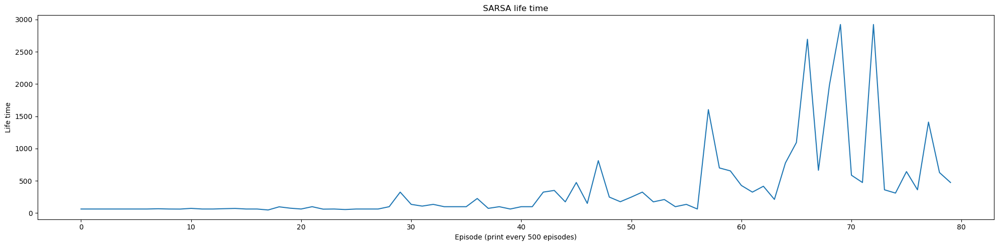

In [15]:
# plot life time against training episodes
fig, ax1 = plt.subplots(figsize=(20, 5))

plt.xlabel(f'Episode (print every {print_every_episode} episodes)')
plt.ylabel('Life time')
plt.title('SARSA life time')
plt.plot(range(len(lifetime_per_epoch_S)), lifetime_per_epoch_S)

fig.tight_layout()
plt.show()

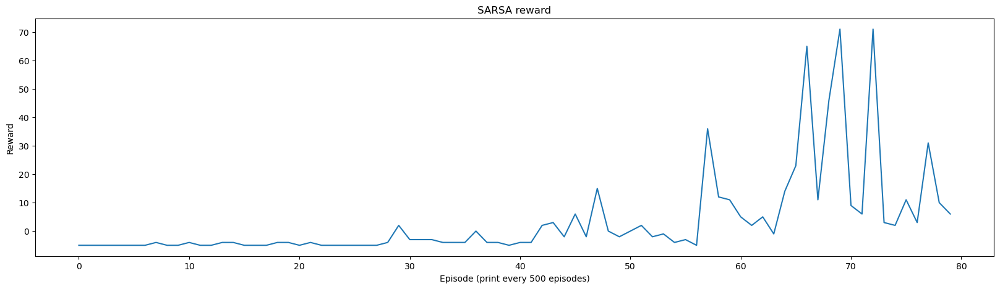

In [16]:
# plot reward against training episodes
fig, ax1 = plt.subplots(figsize=(20, 5))

plt.xlabel(f'Episode (print every {print_every_episode} episodes)')
plt.ylabel('Reward')
plt.title('SARSA reward')
plt.plot(range(len(reward_per_epoch_S)), reward_per_epoch_S)

plt.show()

## Report

下面四張圖分別是Q-learning與SARSA的lifetime和reward
* lifetime: Game_over之前做了幾個action  
* reward: 每過一個水管+1，死掉-5

Lifetime方面，兩者的圖形看起來十分相似，但是Q-learning有更多的episodes低於1000，而SARSA則平均而言執行更多action。
即Q-learning會選當前最佳策略，所以可能會執行較少action後就game over，而SARSA則是相對保守，所以平均執行更多action。
但Q-learning最大的lifetime(4000)比SARSA還高，可能是恰好走到一條reward較高(風險也較高)的路，所以有一個高峰值。

Reward方面，和lifetime的圖形十分相似，
可以發現Q-learning雖然平均而言分數比SARSA低，但是最高分數比SARSA高，和講義上的cliff範例結果相同，即Q-learning會因為選擇最佳策略導致高風險高報酬，而SARSA則是相對穩健保守。

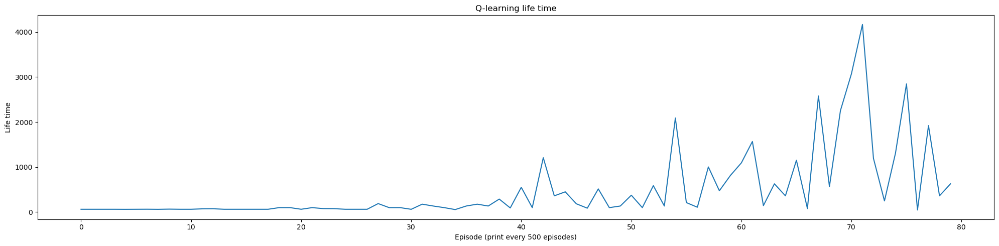

In [17]:
# plot life time against training episodes
fig, ax1 = plt.subplots(figsize=(20, 5))

plt.xlabel(f'Episode (print every {print_every_episode} episodes)')
plt.ylabel('Life time')
plt.title('Q-learning life time')
plt.plot(range(len(lifetime_per_epoch_Q)), lifetime_per_epoch_Q)

fig.tight_layout()
plt.show()

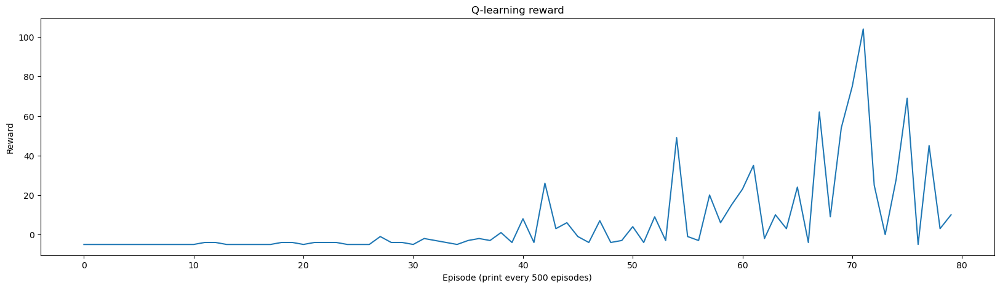

In [18]:
# plot reward against training episodes
fig, ax1 = plt.subplots(figsize=(20, 5))

plt.xlabel(f'Episode (print every {print_every_episode} episodes)')
plt.ylabel('Reward')
plt.title('Q-learning reward')
plt.plot(range(len(reward_per_epoch_Q)), reward_per_epoch_Q)

plt.show()

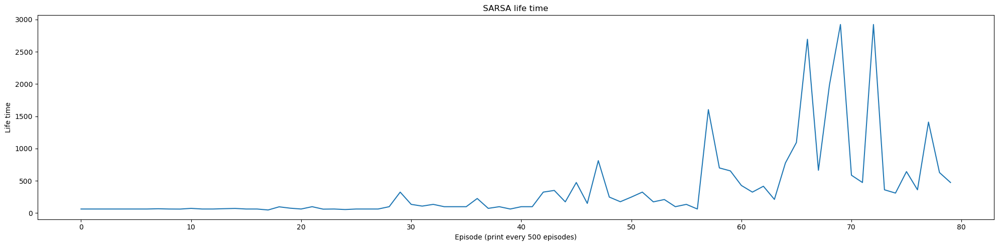

In [19]:
# plot life time against training episodes
fig, ax1 = plt.subplots(figsize=(20, 5))

plt.xlabel(f'Episode (print every {print_every_episode} episodes)')
plt.ylabel('Life time')
plt.title('SARSA life time')
plt.plot(range(len(lifetime_per_epoch_S)), lifetime_per_epoch_S)

fig.tight_layout()
plt.show()

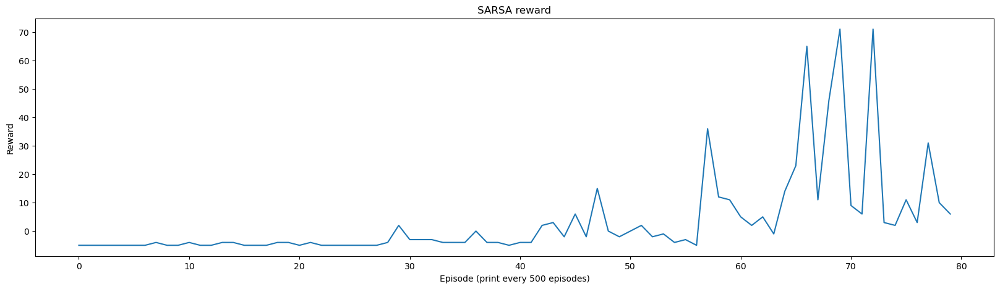

In [20]:
# plot reward against training episodes
fig, ax1 = plt.subplots(figsize=(20, 5))

plt.xlabel(f'Episode (print every {print_every_episode} episodes)')
plt.ylabel('Reward')
plt.title('SARSA reward')
plt.plot(range(len(reward_per_epoch_S)), reward_per_epoch_S)

plt.show()